Optimization of parameters with AD doesn't only refer to weights of a neural network!

Differentiable programming: differentiate anything that is parameterizable!!!

In HEP, can do likelihood fits

(example for likelihood fits courtesy the `pyhf`team)

In [1]:
import jax
import jax.numpy as jnp
import numpy as np
import pyhf
import matplotlib.pyplot as plt

pyhf.set_backend('jax')


Create a model with two bins:
- 5 expected signal events
- $30\pm4$ expected background events
- 36

In [8]:
m = pyhf.simplemodels.uncorrelated_background([5.],[10.],[3.5])
pars = jnp.array(m.config.suggested_init())
data = jnp.array([15] + m.config.auxdata)
m.logpdf(pars,data)
bestfit = pyhf.infer.mle.fit(data,m)
bestfit

Array([1., 1.], dtype=float64)

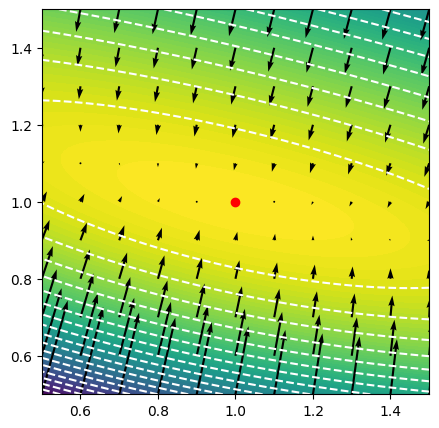

In [9]:
grid = x,y = np.mgrid[.5:1.5:101j,.5:1.5:101j]

points = np.swapaxes(grid,0,-1).reshape(-1,2)
v = jax.vmap(m.logpdf, in_axes = (0,None))(points,data)
v = np.swapaxes(v.reshape(101,101),0,-1)
plt.contourf(x,y,v, levels = 100)
plt.contour(x,y,v, levels = 20, colors = 'w')



grid = x,y = np.mgrid[.5:1.5:11j,.5:1.5:11j]
points = np.swapaxes(grid,0,-1).reshape(-1,2)
values, gradients = jax.vmap(
    jax.value_and_grad(
        lambda p,d: m.logpdf(p,d)[0]
    ), in_axes = (0,None)
)(points,data)

plt.quiver(
    points[:,0],
    points[:,1],
    gradients[:,0],
    gradients[:,1],
    angles = 'xy',
    scale = 75
)
plt.scatter(bestfit[0],bestfit[1], c = 'r')

plt.xlim(0.5,1.5)
plt.ylim(0.5,1.5)
plt.gcf().set_size_inches(5,5)

Create a model with two bins:
- 5 and 3 expected signal events
- $30\pm4$ and $10\pm2.5$ expected background events
- 36 and 11 observed events

In [ ]:
m = pyhf.simplemodels.uncorrelated_background([5., 3.],[30., 10.],[4., 23.5])
pars = jnp.array(m.config.suggested_init())
data = jnp.array([36., 11.] + m.config.auxdata)
m.logpdf(pars,data)
bestfit = pyhf.infer.mle.fit(data,m)
bestfit

#.............

# Handwritten digits

This merges tutorials from:
- https://rockpool.ai/basics/hello_MNIST.html
- Pennylane

and adds a comparison between the performance of the neuromorphic, classica, and the quantum mode.


In [60]:
import torch
import torch
import torch.nn as nn  
import torch.optim as optim 
import torch.nn.functional as F 
from torch.utils.data import DataLoader 
import torchvision
import torchinfo
from tqdm import tqdm

import matplotlib
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if torch.backends.mps.is_available():
    device = torch.device("mps")
    torch.set_default_dtype(torch.float32)


Load the MNIST dataset and inspect it.
This dataset is handily hosted in the package `torchvision`.

You can also apply a series of transformations, e.g. the following if you want to standardize automatically the dataset to the global mean and variance. Suggestion: start by not standardizing.

NOTE: the standardization transform is called `normalize` in the package `torchvision`.

```
transform=torchvision.transforms.Compose([
                               torchvision.transforms.ToTensor(),
                               torchvision.transforms.Normalize(
                                 (0.1307,), (0.3081,))
                             ]))
```

Another transform it is usually done is to divide values in the image by `255` to have them before 0 and 1.


In [61]:
batch_size = 64 # Or whichever value you may see fit
# You can also explore whether dense and convolutional networks work best with different batch sizes

# Load Data
train_dataset = torchvision.datasets.MNIST(root='dataset/', train=True, transform=torchvision.transforms.ToTensor(),  
                                           #target_transform = torchvision.transforms.Compose([
                                           # lambda x:torch.LongTensor([x]), # or just torch.tensor
                                           # lambda x:F.one_hot(x,10)]),
                                            download=True)
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = torchvision.datasets.MNIST(root='dataset/', train=False, transform=torchvision.transforms.ToTensor(), 
#target_transform = torchvision.transforms.Compose([
#                                 lambda x:torch.LongTensor([x]), # or just torch.tensor
#                                 lambda x:F.one_hot(x,10)]),
                                          download=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=True)

We can inspect the dataset.

Suggestion: inspect the dataset after trying out different transforms.

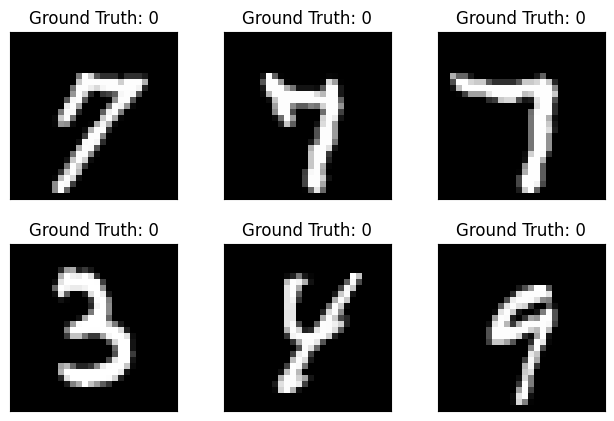

In [62]:
examples = enumerate(test_loader)
batch_idx, (example_data, example_targets) = next(examples)

example_data.shape

import matplotlib.pyplot as plt

fig = plt.figure()
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.tight_layout()
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  plt.title("Ground Truth: {}".format(torch.argmax(example_targets[i])))
  plt.xticks([])
  plt.yticks([])


Let's create a convolutional network

Relevant parameters:

- `in_channels`: number of input channels. For black-and-white images, this is 1. RGB images have 3.
- `num_classes`: how many digits do we want to recognize?

The first `Conv2d` layer has 8 kernels of size 3x3, i.e. splits the image in eight separate channels each with its own convolution operation. Padding ensures the size of the image remains the same.
The second `Conv2d` layer has 16 filters, also with 3x3 kernel.

The `MaxPool2d` layer has a 2x2 kernel and a stride of 2. This does averaging and dimensional reduction, downsampling the image by a factor 2 in each dimension (from 28x28 to 14x14 the first time we apply it, and from 14x14 to 7x7 the second time).

The output of the second `Conv2d` layer will therefore a 16-channel image where each channel is 7x7. We flatten it to a one-dimensional vector per image to feed it to a dense layer that does classification.


In [63]:
class ConvNetwork(nn.Module):
    def __init__(self, in_channels=1, num_classes=10, device="cpu"):
        super(ConvNetwork, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
            nn.ReLU(), 
            nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2)),
            nn.Flatten(),
            nn.Linear(16*7*7, num_classes)
            # Another activation function here? Or not?
        )
    def forward(self, x):
        x = self.conv(x)
        return x
    

In [64]:
in_channels = 1 # You have to figure this out
num_classes = 10 # You have to figure this out
learning_rate = 0.01 # You have to figure this out
num_epochs = 5 # You have to figure this out

# Initialize Network
model = ConvNetwork(in_channels=in_channels, num_classes=num_classes, device=device).to(device)
print(next(model.parameters()).device)
# Loss and Optimizer
criterion = torch.nn.CrossEntropyLoss() # You have to figure this out
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)

mps:0


In [65]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters()), sum(p.numel() for p in model.parameters() if p.requires_grad)

total_pars, trainable_pars = count_parameters(model)
print("I have ", total_pars, "parameter and ", trainable_pars, " trainable parameters")
    
print("len", len([i for i in model.parameters()]))


torchinfo.summary(model)

I have  9098 parameter and  9098  trainable parameters
len 6


Layer (type:depth-idx)                   Param #
ConvNetwork                              --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       80
│    └─ReLU: 2-2                         --
│    └─MaxPool2d: 2-3                    --
│    └─Conv2d: 2-4                       1,168
│    └─ReLU: 2-5                         --
│    └─MaxPool2d: 2-6                    --
│    └─Flatten: 2-7                      --
│    └─Linear: 2-8                       7,850
Total params: 9,098
Trainable params: 9,098
Non-trainable params: 0

In [66]:
def train_loop(dataloader, model, loss_fn, optimizer, scheduler, cnn, device):
    losses=[] # Track the loss function
    accs= [] # Track accuracies
    
    # Set the model to training mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.train()
    for batch, (X, y) in enumerate(dataloader):
    #for batch, (X, y) in tqdm(enumerate(dataloader, 0), unit="batch", total=len(dataloader)):
    #for (X,y) in tqdm(dataloader):
        # Reset gradients (to avoid their accumulation)
        optimizer.zero_grad()
        X = X.to(device)
        y = y.to(device)
        # Compute prediction and loss
        if not cnn:
            X = X.reshape(X.shape[0], -1)
        pred = model(X)
        #print("Y", y)
        #pred= pred.reshape([pred.shape[0], 1, num_classes])
        #print(torch.argmax(pred, dim=2), torch.argmax(y, dim=2))
        loss = loss_fn(pred,y)
        #print(loss)
        losses.append(loss.detach().cpu())
        acc = (torch.argmax(pred, 1) == y).float().mean()
        accs.append(acc.detach().cpu())
        loss.backward()
        optimizer.step()

    return np.mean(losses), np.mean(accs)

In [77]:
def test_loop(dataloader, model, loss_fn, cnn, device):

    losses=[] # Track the loss function
    accs = [] # Track accuracies
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        #for batch, (X, y) in tqdm(enumerate(dataloader, 0), unit="batch", total=len(dataloader)):
        for (X,y) in tqdm(dataloader):
            if not cnn:
                X = X.reshape(X.shape[0], -1)
            X=X.to(device)
            y=y.to(device)
            pred = model(X)
            #pred= pred.reshape([pred.shape[0], 1, num_classes])
            loss = loss_fn(pred, y)
            acc = (torch.argmax(pred, 1) == y).float().mean()
            losses.append(loss.detach().cpu())
            accs.append(acc.detach().cpu())
            test_loss += loss
            #correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            
    return np.mean(losses), np.mean(accs)

In [78]:
input_size = 28*28*1 # You have to figure this out
num_classes = 10 # You have to figure this out
learning_rate = 0.001 # You have to figure this out
num_epochs = 3 # You have to figure this out


In [79]:
conv_train_losses=[]
conv_test_losses=[]
conv_train_accuracies=[]
conv_test_accuracies=[]
for t in range(num_epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    conv_train_loss, conv_train_accuracy = train_loop(train_loader, model, criterion, optimizer, scheduler, True, device)
    conv_test_loss, conv_test_accuracy = test_loop(test_loader, model, criterion, True, device)
    conv_train_losses.append(conv_train_loss)
    conv_train_accuracies.append(conv_train_accuracy)
    conv_test_losses.append(conv_test_loss)
    conv_test_accuracies.append(conv_test_accuracy)
    print("Avg train loss", conv_train_loss, ", Avg test loss", conv_test_loss, "Current learning rate", scheduler.get_last_lr())
print("Done!")

Epoch 1
-------------------------------


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:00<00:00, 293.43it/s]


Avg train loss 0.057176918 , Avg test loss 0.050443955 Current learning rate [0.01]
Epoch 2
-------------------------------


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:00<00:00, 310.12it/s]


Avg train loss 0.05126789 , Avg test loss 0.05320445 Current learning rate [0.01]
Epoch 3
-------------------------------


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:00<00:00, 311.77it/s]

Avg train loss 0.049097523 , Avg test loss 0.074436575 Current learning rate [0.01]
Done!


# Neuromorphic

In [80]:
# Neuromorphic

import torchvision

from tqdm.autonotebook import tqdm, trange

from IPython.display import Image

/var/folders/_z/jj9k3dln24d4m13tc_cfv5dh0000gn/T/ipykernel_45670/114199334.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


## Leaky integrate-and-fire

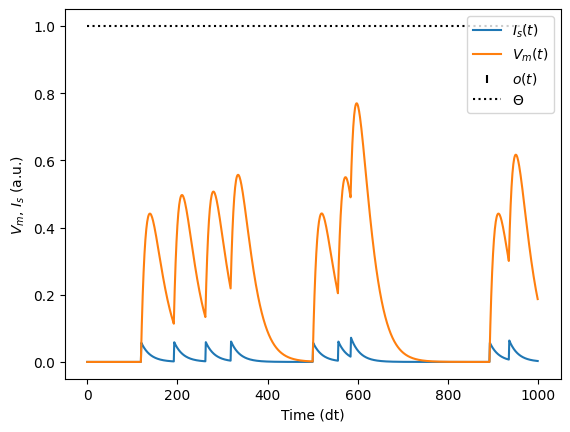

In [81]:
# - Import the SNN modules from rockpool
from rockpool.nn.modules import LIF
import numpy as np
# - Generate a spiking neuron
neuron = LIF(1)

# - Simulate this neuron for 1 sec with poisson spiking input z(t)
num_timesteps = int(1/neuron.dt)
input_z = 0.06 * (np.random.rand(num_timesteps) < 0.0125)
output, _, rec_dict = neuron(input_z, record = True)

# - Display the input, internal state and output events
plt.figure()
plt.plot(rec_dict['isyn'].squeeze(), label = '$I_s(t)$')
plt.plot(rec_dict['vmem'].squeeze(), label = '$V_m(t)$')
b, t, n = np.nonzero(output)
plt.scatter(t, n, marker='|', c = 'k', label = '$o(t)$')
plt.plot([0, num_timesteps], [neuron.threshold] * 2, 'k:', label='$\Theta$')
plt.xlabel('Time (dt)')
plt.ylabel('$V_m$, $I_s$ (a.u.)')
plt.legend();

Encode the data in a SNN-compliant way


In [82]:
batch_size = 256
evens = list(range(0, len(train_dataset), 100))
evenst = list(range(0, len(test_dataset), 100))
# - Create a data loader for the training dataset
train_subdata = torch.utils.data.Subset(train_dataset, evens)
test_subdata = torch.utils.data.Subset(test_dataset, evens)

train_loader = torch.utils.data.DataLoader(
    train_subdata,
    batch_size=batch_size, shuffle=True
)

# - Create a test dataset
test_loader = torch.utils.data.DataLoader(
    test_subdata,
    batch_size=batch_size, shuffle=True
)
test_loader = torch.utils.data.DataLoader(
    torchvision.datasets.MNIST(
        root=".",
        train=False,
        transform=torchvision.transforms.ToTensor(),
    ),
    batch_size=batch_size,
)

Now we need to decide how to encode the data samples for the SNN. The MNIST samples are resolution images, with no temporal component. We will encode the images by arranging the pixels into a 784-element vector, and creating 784 spiking input channels. We’ll use a Poisson process to generate an average input rate for each channel, according to the intensity of the corresponding pixel. Pixels with value 0 will have generate no input events; pixels with value 1 will generate the highest rate of events. To do so we need to define how many time-steps each sample will take, and what the duration of a single time-step will be.

In [83]:
# - Define the temporal aspects of a data sample
num_timesteps = 100
dt = 10e-3

# - Extract the number of classes and input channels
num_classes = len(torchvision.datasets.MNIST.classes)
input_channels = train_dataset[0][0].numel()

# - Define a function to encode an input into a poisson event series
def encode_poisson(data: torch.Tensor, num_timesteps: int, scale: float = 0.1) -> torch.Tensor:
  num_batches, frame_x, frame_y = data.shape
  data = scale * data.view((num_batches, 1, -1)).repeat((1, num_timesteps, 1))
  return (torch.rand(data.shape) < (data * scale)).float()

We also need to determine what the target output of the network will look like. The MNIST dataset has 10 classes. We’ll build a network with 10 output neurons, one for each class, and train the network to produce a high event rate for the target class and no events for the non-target classes. Our target will also be a time series of events, with the same duration as the input time series, and with 10 channels.

In [84]:
# - Define a function to encode the network target
def encode_class(class_idx: torch.Tensor, num_classes: int, num_timesteps: int) -> torch.Tensor:
  num_batches = class_idx.numel()
  target = torch.nn.functional.one_hot(class_idx, num_classes = num_classes)
  return target.view((num_batches, 1, -1)).repeat((1, num_timesteps, 1)).float()


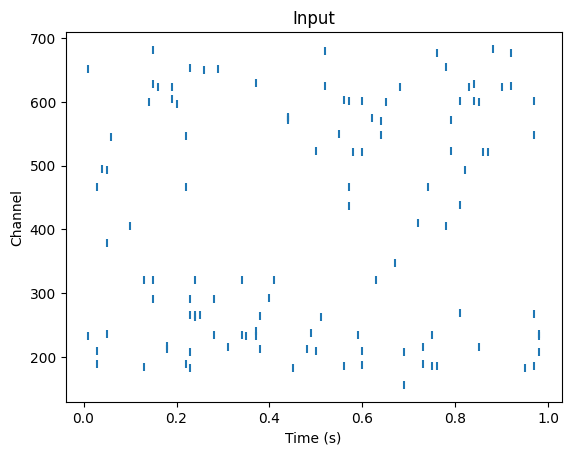

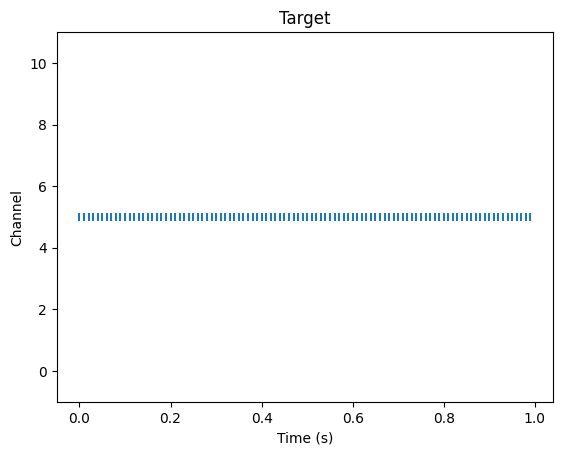

In [85]:
# - Get one sample
frame, class_idx = train_dataset[0]

# - Encode the input and targets
data = encode_poisson(frame, num_timesteps)
target = encode_class(torch.tensor(class_idx), num_classes, num_timesteps)

# - Plot the poisson input for this sample
plt.figure()
b, t, n = torch.nonzero(data, as_tuple = True)
plt.scatter(t * dt, n, marker = '|')
plt.xlabel('Time (s)')
plt.ylabel('Channel')
plt.title('Input')

# - Plot the target event series for this sample
b, t, n = torch.nonzero(target, as_tuple = True)
plt.figure()
plt.scatter(t * dt, n, marker = '|')
plt.ylim([-1, num_classes+1])
plt.xlabel('Time (s)')
plt.ylabel('Channel')
plt.title('Target');



Rockpool allows you to build SNNs with a simple syntax, similar to PyTorch. We support several computational back-ends in Rockpool, one of which is PyTorch, which we will use here.

LIFTorch is a Rockpool and torch module which provides a trainable simulation of LIF spiking neurons. LinearTorch is a linear weight matrix, comparable to the torch nn.Linear module.

To build simple feed-forward networks, we use the Sequential combinator from Rockpool, which functions like the torch nn.Sequential combinator.

By default, Rockpool allows you to train the time constants

and other parameters of an SNN. For simplicity, here we’ll define them as constant (i.e. non-trainable), using the Constant parameter decorator.

The network architecture we will use is shown below; a simple two-layer SNN.

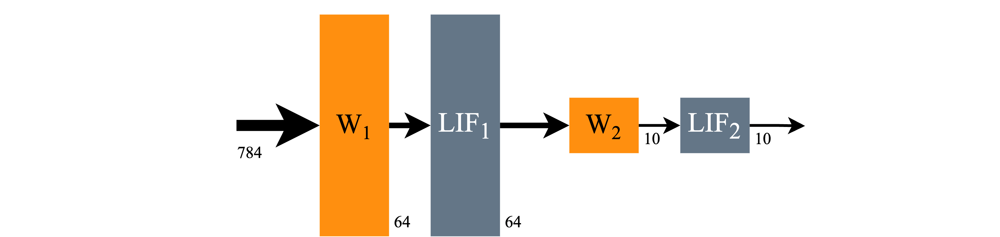

In [86]:
Image('https://www.hep.uniovi.es/vischia/persistent/figures/basics_hello_MNIST_14_0.png')

In [87]:
# - Import network packages
from rockpool.nn.modules import LIFTorch, LinearTorch
from rockpool.nn.combinators import Sequential
from rockpool.parameters import Constant

# - Define a simple network
num_hidden = 64
tau_mem = Constant(100e-3)
tau_syn = Constant(50e-3)
threshold = Constant(1.)
bias = Constant(0.)

# - Define a two-layer feed-forward SNN
snn = Sequential(
    LinearTorch((input_channels, num_hidden)),
    LIFTorch(num_hidden, tau_syn = tau_syn, tau_mem = tau_mem, threshold = threshold, bias = bias, dt = dt),

    LinearTorch((num_hidden, num_classes)),
    LIFTorch(num_classes, tau_syn = tau_syn, tau_mem = tau_mem, threshold = threshold, bias = bias, dt = dt)
)
print(snn)

TorchSequential  with shape (784, 10) {
    LinearTorch '0_LinearTorch' with shape (784, 64)
    LIFTorch '1_LIFTorch' with shape (64, 64)
    LinearTorch '2_LinearTorch' with shape (64, 10)
    LIFTorch '3_LIFTorch' with shape (10, 10)
}


# Untrained SNN

Let’s examine the un-trained output of this network. We simulate the network identically as with the single LIF neuron above, just by passing input data to the module. We’ll use the single data sample we encoded above. The record = True argument tells Rockpool to record all the internal state of the SNN during evolution.


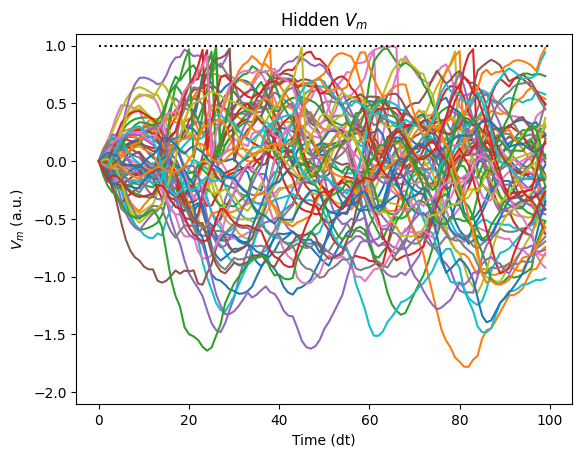

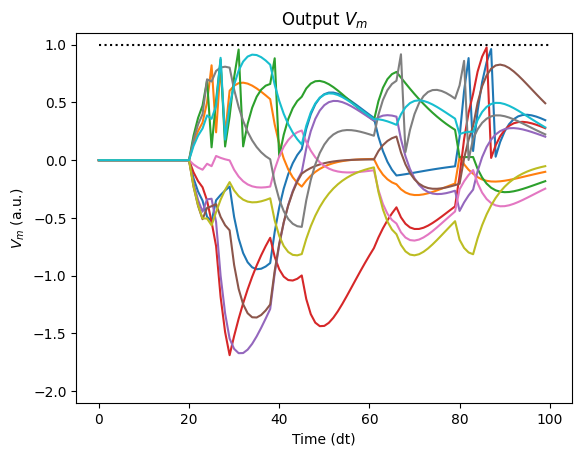

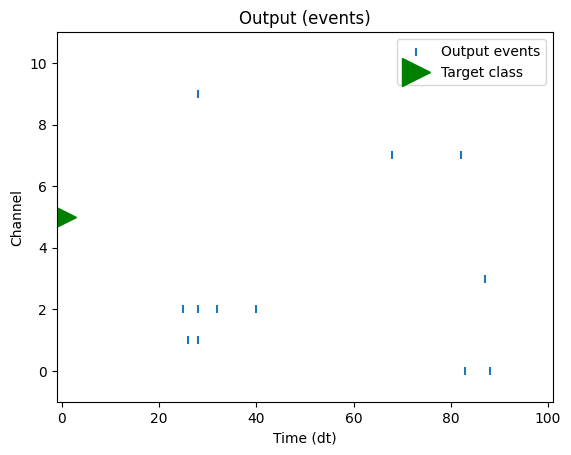

In [88]:
# - Simulate the untrained network, record internal state
output, _, rec_dict = snn(data, record = True)

# - Display the internal state and output
plt.plot(rec_dict['1_LIFTorch']['vmem'][0].detach());
plt.plot([0, num_timesteps], [threshold] * 2, 'k:')
plt.ylim([-2.1, 1.1])
plt.xlabel('Time (dt)')
plt.ylabel('$V_m$ (a.u.)')
plt.title('Hidden $V_m$')

plt.figure()
plt.plot(rec_dict['3_LIFTorch']['vmem'][0].detach());
plt.plot([0, num_timesteps], [threshold] * 2, 'k:')
plt.ylim([-2.1, 1.1])
plt.xlabel('Time (dt)')
plt.ylabel('$V_m$ (a.u.)')
plt.title('Output $V_m$')

plt.figure()
t, n = torch.nonzero(rec_dict['3_LIFTorch_output'][0].detach(), as_tuple = True)
plt.scatter(t, n, marker = '|', label='Output events')
plt.plot(0, class_idx, 'g>', markersize=20, label='Target class')
plt.ylim([-1, num_classes+1])
plt.xlim([-1, num_timesteps+1])
plt.xlabel('Time (dt)')
plt.ylabel('Channel')
plt.title('Output (events)')
plt.legend();



In [89]:
from torch.optim.adam import Adam

# - Initialise the optimizer with the network parameters
optimizer = Adam(snn.parameters().astorch())

In [90]:
def neuromorphic_train(model, device, train_loader, optimizer):
  # - Prepare model for training
  model.train()
  losses = []

  # - Loop over the dataset for this epoch
  for data, class_idx in tqdm(train_loader, leave=False, desc='Training', unit='batch'):
    # - Encode input and target
    data = encode_poisson(data.squeeze(), num_timesteps)
    target = encode_class(class_idx, num_classes, num_timesteps)

    # - Zero gradients, simulate model
    optimizer.zero_grad()
    output, _, _ = model(data.to(device))

    # - Compute MSE loss and perform backward pass
    loss = torch.nn.functional.mse_loss(output, target.to(device))
    loss.backward()
    optimizer.step()

    # - Keep track of the losses
    losses.append(loss.item())

  return losses

In [91]:
def neuromorphic_test(model, device, test_loader):
    # - Prepare model for evaluation
    model.eval()
    test_loss = 0
    correct = 0

    with torch.no_grad():
      # - Loop over the dataset
      for data, class_idx in tqdm(test_loader, desc='Testing', leave=False, unit='batch'):
        # - Encode the input and target
        input = encode_poisson(data.squeeze(), num_timesteps)
        target = encode_class(class_idx, num_classes, num_timesteps)

        # - Evaluate the model
        output, _, _ = model(input.to(device))

        # - Compute loss and prediction
        test_loss += torch.nn.functional.mse_loss(output, target.to(device)).item()
        pred = output.sum(axis = 1).argmax(axis = 1, keepdim=True).cpu()
        correct += pred.eq(class_idx.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    accuracy = 100.0 * correct / len(test_loader.dataset)

    return test_loss, accuracy

In [92]:
# - Initial loss and accuracy
test_loss, test_acc = neuromorphic_test(snn.to(device), device, test_loader)
print(f'Initial test loss {test_loss}, accuracy {test_acc}%')

Testing:   0%|          | 0/40 [00:00<?, ?batch/s]

Initial test loss 0.0004348511941730976, accuracy 8.57%


Training:   0%|          | 0/3 [00:00<?, ?epoch/s]

Training:   0%|          | 0/3 [00:00<?, ?batch/s]

Testing:   0%|          | 0/40 [00:00<?, ?batch/s]

Training:   0%|          | 0/3 [00:00<?, ?batch/s]

Testing:   0%|          | 0/40 [00:00<?, ?batch/s]

Training:   0%|          | 0/3 [00:00<?, ?batch/s]

Testing:   0%|          | 0/40 [00:00<?, ?batch/s]

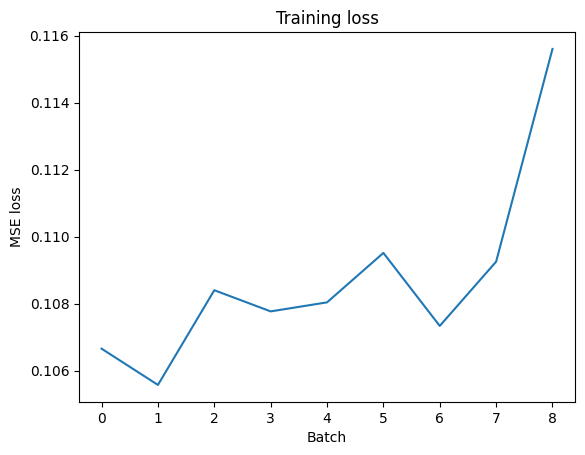

In [93]:
# - Train some epochs
num_epochs = 3

all_losses = []
ep_loop = trange(num_epochs, desc='Training', unit='epoch')
for epoch in ep_loop:
  ep_loop.set_postfix(test_loss = test_loss, test_acc = f'{test_acc}%')
  losses = neuromorphic_train(snn.to(device), device, train_loader, optimizer)
  all_losses.extend(losses)

  # - Get test loss and accuracy
  test_loss, test_acc = neuromorphic_test(snn.to(device), device, test_loader)

plt.plot(all_losses)
plt.xlabel('Batch')
plt.ylabel('MSE loss')
plt.title('Training loss');

In [94]:
# - Trained loss and accuracy
print(f'Final test loss {test_loss}, accuracy {test_acc}%')
neuro_accuracy = test_acc

Final test loss 0.00045571095868945124, accuracy 17.75%


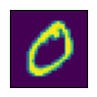

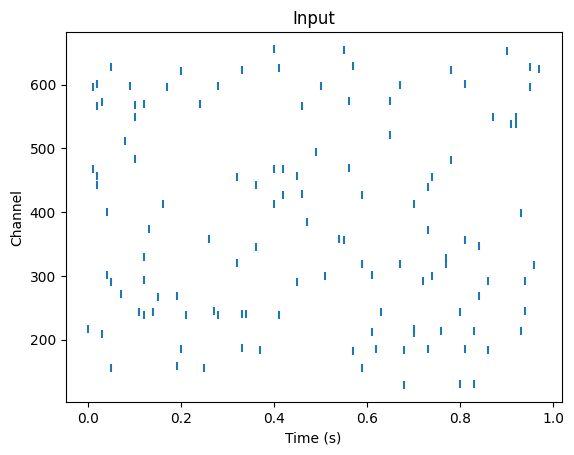

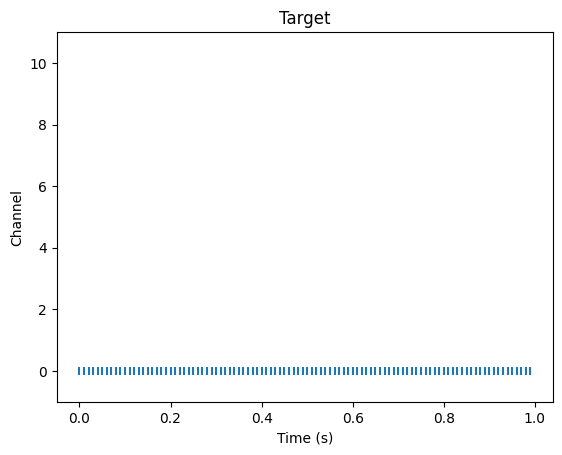

In [95]:
# - Pull a single test sample and display it
frame, class_idx = train_dataset[1]
data = encode_poisson(frame, num_timesteps)
target = encode_class(torch.tensor(class_idx), num_classes, num_timesteps)

plt.figure(figsize=(1, 1))
plt.imshow(frame[0])
plt.xticks([])
plt.yticks([])

plt.figure()
b, t, n = torch.nonzero(data, as_tuple = True)
plt.scatter(t * dt, n, marker='|')
plt.xlabel('Time (s)')
plt.ylabel('Channel')
plt.title('Input')

b, t, n = torch.nonzero(target, as_tuple = True)
plt.figure()
plt.scatter(t * dt, n, marker='|')
plt.ylim([-1, num_classes+1])
plt.xlabel('Time (s)')
plt.ylabel('Channel')
plt.title('Target');

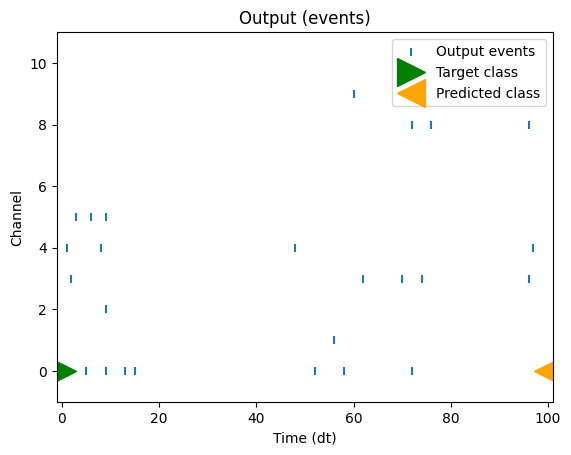

In [96]:
# - Simulate the network with this sample
output, _, _ = snn.cpu()(data)
pred = output.sum(axis = 1).argmax(axis = 1, keepdim=True).cpu()

# - Display the network output
b, t, n = torch.nonzero(output, as_tuple=True)

plt.scatter(t, n, marker='|', label='Output events')
plt.plot(0, class_idx, 'g>', markersize=20, label='Target class')
plt.plot(100, pred, '<', c='orange', markersize=20, label='Predicted class')
plt.ylim([-1, num_classes+1])
plt.xlim([-1, num_timesteps+1])
plt.xlabel('Time (dt)')
plt.ylabel('Channel')
plt.title('Output (events)')
plt.legend();



Things to consider for full trainings

- Deeper or more complex network architecture
- More hidden neurons
- Training time constants and other parameters
- Different loss function or output encoding

<Axes: >

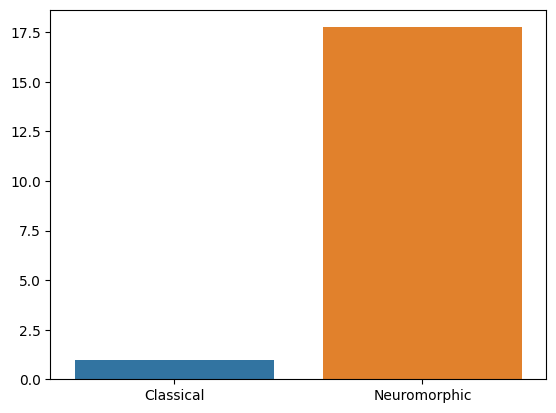

In [102]:
import seaborn as sns

#qnn_accuracy = qnn_results[1]
cnn_accuracy = conv_test_accuracies[1]

#sns.barplot(x=["Quantum", "Classical, full", "Classical, fair", "Neuromorphic"],
 #           y=[qnn_accuracy, cnn_accuracy, fair_nn_accuracy, neuro_accuracy])

sns.barplot(x=["Classical", "Neuromorphic"],
            y=[cnn_accuracy, neuro_accuracy])


# Quantum

In [10]:
import pennylane as qml

In [11]:
batch_size = 1000
epochs = 10
n_qubits = 28  # 2^4 = 16, suficiente para 14 variables + padding
n_layers = 4  # Capas en la red cuántica


In [12]:
dev = qml.device("default.qubit", wires=n_qubits)

In [13]:
def feature_map(x):
    qml.AmplitudeEmbedding(features=x, wires=range(n_qubits), normalize=True, pad_with=0)

def variational_circuit(weights):
    # Encoding of 4 classical input values
    for j in range(n_qubits):
        qml.RY(np.pi * phi[j], wires=j)

    # Random quantum circuit
    RandomLayers(rand_params, wires=list(range(n_qubits)))

    # Measurement producing 4 classical output values
    return [qml.expval(qml.PauliZ(j)) for j in range(n_qubits)]

@qml.qnode(dev, interface="torch")
def quantum_nn(inputs, weights):
    feature_map(inputs)
    variational_circuit(weights)
    return qml.expval(qml.PauliZ(0))  # Medición en el primer qubit

weight_shapes = {"weights": (n_layers, n_qubits)}
qlayer = qml.qnn.TorchLayer(quantum_nn, weight_shapes)
clayer = torch.nn.Linear(16*7*7, num_classes)
softmax = torch.nn.Softmax(dim=1)

layers = [qlayer, clayer]
q_model = torch.nn.Sequential(*layers)


# Inicializar los pesos del circuito cuántico
weights_qnn = torch.randn(n_layers, n_qubits, 3, device = device, requires_grad=True)  # Parámetros entrenables

# Definir el optimizador
optimizer = torch.optim.Adam([weights_qnn], lr=0.1)

In [ ]:
train_loss_history = []
print(len(train_loader))


quantum_train_losses=[]
quantum_test_losses=[]
quantum_train_accuracies=[]
quantum_test_accuracies=[]
for t in range(num_epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    quantum_train_loss, quantum_train_accuracy = train_loop(train_loader, q_model, criterion, optimizer, scheduler, True, device)
    quantum_test_loss, quantum_test_accuracy = test_loop(test_loader, q_model, criterion, True, device)
    quantum_train_losses.append(quantum_train_loss)
    quantum_train_accuracies.append(quantum_train_accuracy)
    quantum_test_losses.append(quantum_test_loss)
    quantum_test_accuracies.append(quantum_test_accuracy)
    print("Avg train loss", quantum_train_loss, ", Avg test loss", quantum_test_loss, "Current learning rate", scheduler.get_last_lr())
print("Done!")


Takes forever! This is because simulated quantum circuits of 28 qbits are too much :)

Let's downsize the images

In [18]:
batch_size = 64 # Or whichever value you may see fit
# You can also explore whether dense and convolutional networks work best with different batch sizes

# Load Data
train_dataset = torchvision.datasets.MNIST(root='dataset/', train=True, transform=torchvision.transforms.Compose(
        [torchvision.transforms.Resize(4), torchvision.transforms.ToTensor()]),  
                                           #target_transform = torchvision.transforms.Compose([
                                           # lambda x:torch.LongTensor([x]), # or just torch.tensor
                                           # lambda x:F.one_hot(x,10)]),
                                            download=True)
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = torchvision.datasets.MNIST(root='dataset/', train=False, transform=torchvision.transforms.Compose(
        [torchvision.transforms.Resize(4), torchvision.transforms.ToTensor()]), 
#target_transform = torchvision.transforms.Compose([
#                                 lambda x:torch.LongTensor([x]), # or just torch.tensor
#                                 lambda x:F.one_hot(x,10)]),
                                          download=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=True)

In [19]:
epochs = 10
n_qubits = 4  # 2^4 = 16, suficiente para 14 variables + padding
n_layers = 4  # Capas en la red cuántica


In [20]:
dev = qml.device("default.qubit", wires=n_qubits)

We now define the quantum nodes that will be used. As we are implementing our multiclass classifier as multiple one-vs-all classifiers, we will use 3 QNodes, each representing one such classifier. That is, circuit1 classifies if a sample belongs to class 1 or not, and so on. The circuit architecture for all nodes are the same. We use the PyTorch interface for the QNodes. Data is embedded in each circuit using amplitude embedding.

In [35]:
def rotation_plus_entangling(W):
    for i in range(num_qubits):
        qml.Rot(W[i, 0], W[i, 1], W[i, 2], wires=i)
    for j in range(num_qubits - 1):
        qml.CNOT(wires=[j, j + 1])
    if num_qubits >= 2:
        # Apply additional CNOT to entangle the last with the first qubit
        qml.CNOT(wires=[num_qubits - 1, 0])



NameError: name 'load_and_process_data' is not defined

In [37]:
#rand_params = np.random.uniform(high=2 * np.pi, size=(n_layers, n_qubits))

def variational_circuit(weights):

    # Random quantum circuit
    qml.RandomLayers(weights, wires=list(range(n_qubits)))

    # Measurement producing 4 classical output values
    return [qml.expval(qml.PauliZ(j)) for j in range(n_qubits)]

@qml.qnode(dev, interface="torch")
def quantum_nn(inputs, weights):
    qml.AmplitudeEmbedding(features=inputs, wires=range(n_qubits), normalize=True, pad_with=0)

        
    vee = variational_circuit(weights)
    return vee  # Medición en el primer qubit

qnodes = []
for iq in range(num_classes):
    qnode = qml.QNode(circuit, dev, interface="torch")
    qnodes.append(qnode)

weight_shapes = {"weights": (n_layers, n_qubits)}
qlayer = qml.qnn.TorchLayer(quantum_nn, weight_shapes)
clayer = torch.nn.Linear(16, num_classes)
softmax = torch.nn.Softmax(dim=1)
layers = [qlayer, clayer]
q_model = torch.nn.Sequential(qlayer, torch.nn.Flatten(),clayer)


# Inicializar los pesos del circuito cuántico
#weights_qnn = torch.randn(n_layers, n_qubits, device = device, requires_grad=True)  # Parámetros entrenables

# Definir el optimizador
optimizer = torch.optim.Adam(model.parameters(), lr=0.1)

torchinfo.summary(q_model)

print(q_model)

Sequential(
  (0): <Quantum Torch Layer: func=quantum_nn>
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=16, out_features=10, bias=True)
)


In [38]:
q_criterion = torch.nn.CrossEntropyLoss() # You have to figure this out
optimizer = torch.optim.Adam(q_model.parameters(), lr=0.1)

quantum_train_losses=[]
quantum_test_losses=[]
quantum_train_accuracies=[]
quantum_test_accuracies=[]
for t in range(num_epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    quantum_train_loss, quantum_train_accuracy = train_loop(train_loader, q_model, q_criterion, optimizer, scheduler, True, device)
    quantum_test_loss, quantum_test_accuracy = test_loop(test_loader, q_model, q_criterion, True, device)
    quantum_train_losses.append(quantum_train_loss)
    quantum_train_accuracies.append(quantum_train_accuracy)
    quantum_test_losses.append(quantum_test_loss)
    quantum_test_accuracies.append(quantum_test_accuracy)
    print("Avg train loss", quantum_train_loss, ", Avg test loss", quantum_test_loss, "Current learning rate", scheduler.get_last_lr())
print("Done!")


Epoch 1
-------------------------------
prediction tensor([[ 0.1490, -0.1118, -0.2597,  0.0516, -0.1111, -0.2139, -0.2929, -0.0520,
          0.0693,  0.0077],
        [ 0.1461, -0.0927, -0.3190,  0.0627,  0.1482, -0.1489, -0.0819, -0.0671,
          0.1538, -0.0212],
        [ 0.0834, -0.0738, -0.2251,  0.0161, -0.0641, -0.1793, -0.1495, -0.0657,
         -0.0362, -0.1010],
        [ 0.0028,  0.1391, -0.2227, -0.1113, -0.3725, -0.0833, -0.2336,  0.1577,
          0.1261,  0.1843],
        [ 0.0786,  0.0689, -0.2605, -0.0343, -0.2071, -0.1050, -0.0920,  0.2944,
          0.3532,  0.1704],
        [ 0.1488, -0.1237, -0.2812,  0.0708,  0.0955, -0.1909, -0.1485, -0.1373,
          0.0345, -0.0950],
        [ 0.1562, -0.1535, -0.2645,  0.0884,  0.0475, -0.2448, -0.1986, -0.1495,
          0.0167, -0.1421],
        [ 0.1832, -0.0524, -0.2186,  0.0415, -0.1133, -0.0563, -0.0765,  0.1551,
          0.0676,  0.1638],
        [ 0.1513, -0.0769, -0.2335,  0.0037, -0.1139, -0.0253, -0.1093,  0.13

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:00<00:00, 171.32it/s]


Avg train loss nan , Avg test loss nan Current learning rate [0.01]
Epoch 2
-------------------------------
prediction tensor([[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, na

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:00<00:00, 166.04it/s]


Avg train loss nan , Avg test loss nan Current learning rate [0.01]
Epoch 3
-------------------------------
prediction tensor([[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan, nan, na

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 157/157 [00:00<00:00, 161.43it/s]

Avg train loss nan , Avg test loss nan Current learning rate [0.01]
Done!
